<a href="https://colab.research.google.com/github/OmiWakode/dog-vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐩 End-to-end Multiclass Dog Breed Classification
This notebook build an end-toend multi class image classifier Tensorlow 2.0 and TensorFlow Hub.

## 1. Problem 
Identify a breed of a dog given its image.

## 2. Data
The data used was Kaggle's dog breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/overview

## 3. Evaluation
The evaluation is file with prediction probablities for each dog breed of each dog breed test image.

## 4. Features
Some information about the data.
* Dealing with images (unstructured data)
* There are 120 breeds of dogs( i.e 120 classificaions)
* There are 100k+ images in training set.(labelled)
* There are 10k+ images in test

In [ ]:
#unzip the uploaded data into google drive
#!unzip "/content/drive/MyDrive/dog-vision/dog-breed-identification .zip" -d "/content/drive/MyDrive/dog-vision"

### Getting Workspace ready

In [34]:
#import necessary tools into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version :", tf.__version__)
print("Hub version: ", hub.__version__)
#Check if running on GPU
print("GPU available" if tf.config.list_physical_devices("GPU") else "not available")

TF version : 2.6.0
Hub version:  0.12.0
GPU available


## Getting Data Ready (Turning it into Tensors)

In [7]:
#checkout the labels 
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/dog-vision/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     b3e2de0e9d1a5c6c180277b87b85971f  scottish_deerhound
freq                                   1                 126


In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


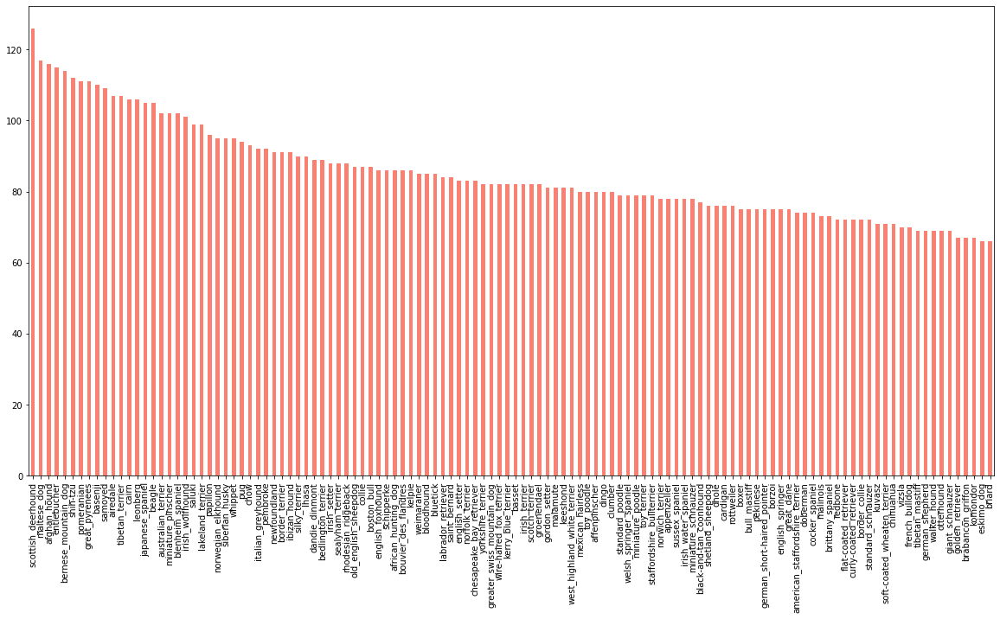

In [4]:
# Images per breed
labels_csv["breed"].value_counts().plot( figsize=(20,10), kind='bar',color = 'salmon');

In [5]:
labels_csv["breed"].value_counts().median()

82.0

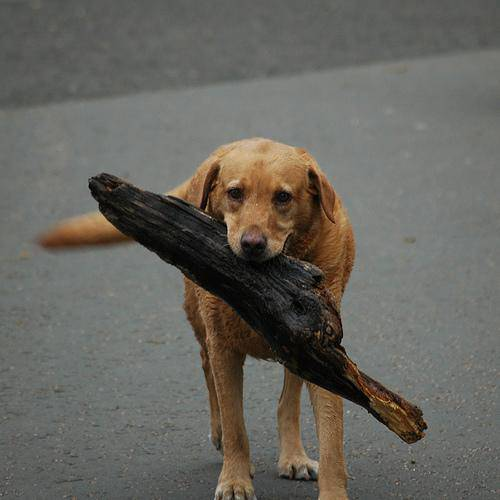

In [8]:
#View in image
from IPython.display import Image
Image("drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

### Getting Images and their labels
Getting a list of all image file pathnames

In [9]:
#Creating filenames for image ID's
filenames = ["drive/MyDrive/dog-vision/train/" + fname for fname in labels_csv['id'] + ".jpg"]
filenames[:10]

['drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
import os
if len(os.listdir('drive/MyDrive/dog-vision/train/')) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("not")

Filenames match actual amount of files


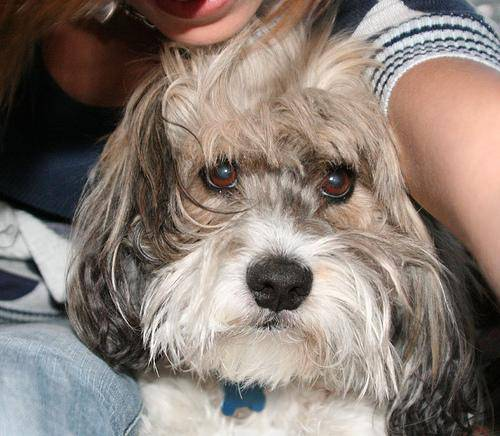

In [12]:
Image(filenames[900])

Preparing labels

In [11]:
import numpy as np
lables = np.array(labels_csv["breed"])
lables

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
#calculating the number of breeds
unique_breeds = np.unique(lables)
len(unique_breeds)

120

In [15]:
#Turn a single label into an array of booleans
print(lables[0])
lables[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [13]:
#Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in lables]
boolean_labels[:10]


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating validation set

In [14]:
#setup x and y variables
x = filenames
y = boolean_labels

In [27]:
#set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:100}

In [28]:
#split data into train and validation sets
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES], y[:NUM_IMAGES], 
                                                  test_size = 0.2, random_state = 42)
len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

### Preprocessing images (turning images into tensors)
Writing a function that:
1. Take an image filepath as input
2. Use tensorflow to read a file and save it to a variable `image`
3. Turn `image` (a jpg) into tensors
4. Normalize the image
5. Resize a `image` to be a shape (224, 224)
6. Return the modified `image`

In [19]:
#Covert an image to a NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape


(257, 350, 3)

In [20]:
#Define image size
IMG_SIZE = 224
#ceate a function for preprocessing images
def process_images(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and converts it into a tensor
  '''
  image = tf.io.read_file(image_path)
  #Turn the jpeg image into numerical tensor with 3 color channels (Red, Green , Blue)
  image = tf.image.decode_jpeg(image, channels = 3)

  #Covert the color channel values from 0-255 to 0-1 (Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)

  #resize the image
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image


## Creating data into batches
Tensor Tuple: `(image, label)`

In [21]:
#Create a function to return the tensor of tuple(image, tuple)
def get_image_labels(image_path, label):
  '''
  Takes an image filepath and label, processess it and returns tuples (image, label)
  '''
  image = process_images(image_path)
  return image, label

In [22]:
BATCH_SIZE = 32
#turn data into batches
def create_batches(x, y=None, valid_data=False, test_data=False):
    '''
    Create batches of data out of image(x) and label(y) pairs.
    '''
    if test_data:
      print("Creating test data batches.....")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
      data_batch = data.map(process_images).batch(BATCH_SIZE)
      return data_batch

    elif valid_data:
      print('Creating valid test data batches....')
      data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                                 tf.constant(y))) #labels
      data_batch = data.map(get_image_labels).batch(BATCH_SIZE)
      return data_batch

    else:
      print('Creating training data batches.....')
      #Turn filepaths into tensors
      data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                                 tf.constant(y))) #labels
      #Shuffling parameters and labels before mapping image process fucntions
      data = data.shuffle(buffer_size=len(x))
      data = data.map(get_image_labels)
      data_batch = data.batch(BATCH_SIZE)
      return data_batch      

In [29]:

train_data = create_batches(x_train,y_train)
val_data = create_batches(x_val, y_val, valid_data=True)

Creating training data batches.....
Creating valid test data batches....


In [30]:
#Check out attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualzing Data Batches

In [31]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(images, labels):
  plt.figure(figsize=(10,10))

  for i in range(25):
    #create subplots
    ax = plt.subplot(5,5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")
  

Iterating over the batches (unbatching)

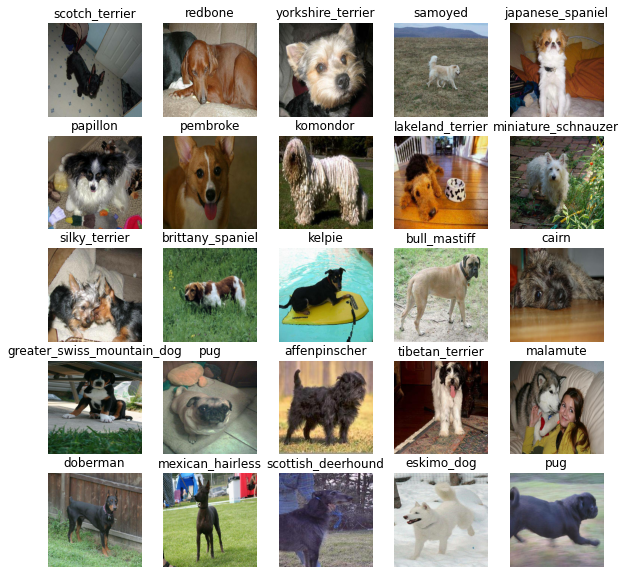

In [32]:
#Visualising training batch
train_images , train_labels = next(train_data.as_numpy_iterator())
train_data, train_labels
show_25_images(train_images,train_labels)

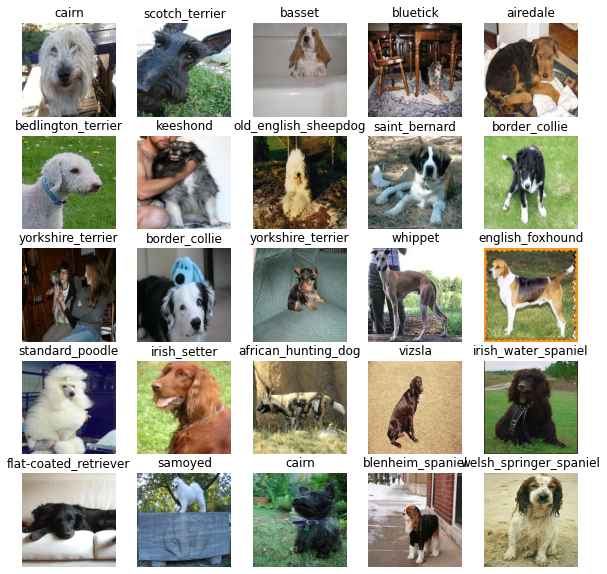

In [33]:
#Visualising validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
Using transfer learning. Few things needs to be defined.
* The input shape (images shape in form of tensors) to model.
* The output shape(image, labels) in form of tensors of model.
* The url of the model from TensorFlow Hub


In [26]:
#Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, color channels

#Setup ouput shape
OUTPUT_SHAPE = len(unique_breeds)

#Set up model url from TensorFlow HUb
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Putting the input, ouput and model , putting them together onto Keras
Create a function that 
* Takes input shape, ouput shape and the model we.ve chosen as parameteres.
* Defines the layers in a Keras model in seqential fasion
* Compiles the model(says how it should be evaluated and improved).
* Builds the model(tells it what kind of input shape it'll be getting).
* Returns the model.




In [27]:
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building Model with: ', MODEL_URL)

  #Setup the model layers
  model = tf.keras.Sequential([
       hub.KerasLayer(MODEL_URL),            #Layer 1 (input layer)
       tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                       activation='softmax') #Layer 2 (output layer)
                       ])
  #Complie the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [36]:
model = create_model()
model.summary()

Building Model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks
2 callbacks:one for TensorBoard (for tracking progress) and another for early stopping which prevents our model from training too long.

### TensorBoard callback
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize the our models training logs using the %tensorboard magic function.

In [37]:
%load_ext tensorboard

In [29]:
import datetime
import os

#Create a function to build TensorBoard callback
def create_tensorboard_callbacks():
  logdir = os.path.join("/content/drive/MyDrive/dog-vision/logs", 
                        datetime.datetime.now().strftime("%Ym%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir = logdir)


## Early Stopping Callback

EarlyStopping the model to prevent overfitting

In [39]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor= "val_accuracy", 
                                                  patience = 3)

## Training a model (on a subset of data)

In [32]:
NUM_EPOCHS = 100 #@param{type: "slider", min: 10, max:100, step: 10}

Training model
* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callbacks()` (we do this here so it creates a log directory of the current date and time).
* Call the `fit()` function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

In [41]:
#Build a function to train and return the trained model
def train_model():
  '''
  Trains a given model and return a trained version
  '''
  model = create_model()

  #Create a TensorBoard Eveytime we train a model
  tensorboard = create_tensorboard_callbacks()

  #Fit the model to the data
  model.fit(
      x = train_data, 
      epochs = NUM_EPOCHS,
      validation_data = val_data,
      validation_freq = 1,
      callbacks = [tensorboard, early_stopping])
  
  return model

In [42]:
#Fitting
model = train_model()

Building Model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 342s 12s/step - loss: 4.6509 - accuracy: 0.0938 - val_loss: 3.5658 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 4s 156ms/step - loss: 1.6866 - accuracy: 0.6600 - val_loss: 2.2748 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 4s 157ms/step - loss: 0.5937 - accuracy: 0.9262 - val_loss: 1.7732 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 4s 158ms/step - loss: 0.2631 - accuracy: 0.9862 - val_loss: 1.5873 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 4s 175ms/step - loss: 0.1550 - accuracy: 0.9962 - val_loss: 1.4831 - val_accuracy: 0.6650
Epoch 6/100
25/25 [==============================] - 4s 160ms/step - loss: 0.1054 - accuracy: 1.0000 - val_loss: 1.4365 - val_accuracy: 0.6800
Epoch 7/100
25/25 [=============================

Model seems to be overfitting, preventing overfitting

### Checking the TensorBoard logs

In [43]:
%tensorboard --logdir /content/drive/MyDrive/dog-vision/logs/2021m02-070454

<IPython.core.display.Javascript object>

## Making and evaluating Predictions

In [44]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 1s 107ms/step


array([[8.15780833e-04, 1.51419794e-04, 1.52079214e-04, ...,
        4.85785167e-05, 2.28085846e-05, 9.48592089e-03],
       [4.65558376e-03, 1.07100280e-03, 5.99319208e-03, ...,
        7.77880021e-04, 5.06001466e-04, 3.35522520e-04],
       [7.46516889e-05, 1.20135512e-04, 5.40118126e-05, ...,
        1.67297738e-04, 3.71590568e-06, 2.54828343e-03],
       ...,
       [5.97311464e-06, 2.82776655e-05, 2.19149806e-05, ...,
        3.54747390e-05, 1.26541985e-04, 9.01340391e-05],
       [2.84587755e-03, 4.88941914e-05, 1.93779575e-04, ...,
        6.18037957e-05, 2.46663432e-04, 5.32644894e-03],
       [6.14251709e-04, 1.34495160e-04, 5.09240024e-04, ...,
        1.45419445e-02, 2.54228804e-03, 3.34889686e-04]], dtype=float32)

In [45]:
# Check the shape of predictions
predictions.shape

(200, 120)

converting an array of probabilities into an actual label.

In [46]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[8.15780833e-04 1.51419794e-04 1.52079214e-04 1.15040792e-04
 3.97166586e-04 6.81915262e-05 4.12514573e-03 3.28301481e-04
 1.10163812e-04 1.88429534e-04 2.80279107e-03 3.81527061e-04
 6.54842297e-04 1.26296640e-04 2.83191621e-04 9.61745973e-04
 7.12018591e-05 9.35653150e-02 6.56301127e-05 2.66792689e-04
 1.02511712e-03 1.12463043e-04 7.13168847e-05 1.58713746e-03
 1.60794181e-04 3.51546565e-04 1.66780517e-01 1.68388346e-04
 1.03115119e-04 1.90518069e-04 1.47178565e-04 6.71846035e-04
 6.78421347e-04 7.75385051e-05 1.40564938e-04 1.32867232e-01
 1.33071313e-04 8.60700093e-04 1.35859838e-04 3.59635887e-05
 6.14828372e-04 3.74335359e-05 1.22956815e-04 1.84775359e-04
 3.36078556e-05 4.96269568e-05 2.61595524e-05 2.25822994e-04
 2.38135239e-04 1.36602350e-04 5.96999125e-05 1.76282614e-04
 7.86840319e-05 3.07904593e-05 2.84953887e-04 1.35901835e-04
 3.37965233e-04 4.40299045e-03 2.33798940e-03 8.00219178e-02
 1.94662949e-04 4.75628403e-05 2.00734416e-04 5.95793827e-05
 1.70834363e-04 9.883786

In [47]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [49]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

we want to be able to view an image, its predicted label and its actual label (true label).

The first function we'll create will:

Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
Convert the prediction probabilities to a predicted label.
Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [50]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

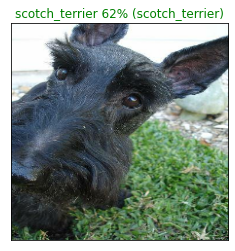

In [51]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [52]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

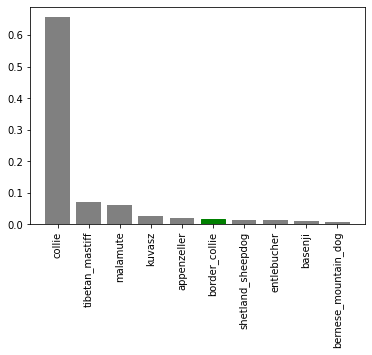

In [53]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

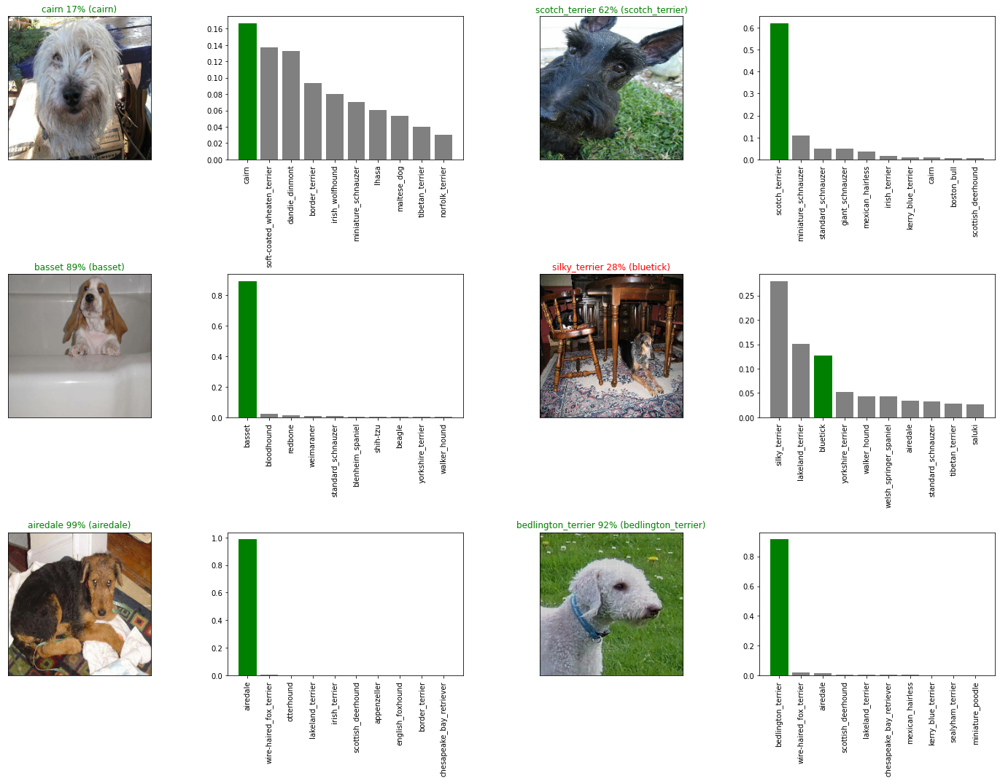

In [54]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving a model

In [57]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/dog-vision/Data/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [58]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [59]:
save_model(model, suffix="1000-images-Adam")

Saving model to: /content/drive/MyDrive/dog-vision/Data/Models/20210820-05421629438152-1000-images-Adam.h5...


'/content/drive/MyDrive/dog-vision/Data/Models/20210820-05421629438152-1000-images-Adam.h5'

In [61]:
model_1000_images = load_model('/content/drive/MyDrive/dog-vision/Data/Models/20210820-05421629438152-1000-images-Adam.h5')

Loading saved model from: /content/drive/MyDrive/dog-vision/Data/Models/20210820-05421629438152-1000-images-Adam.h5
